<a href="https://colab.research.google.com/github/Steven-Macas/deepLearning_SAA/blob/main/deep_learning_parte2_steven.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Training on GPU will be fine for transfer learning as it is not a very demanding process.

## Imports

In [ ]:
import os, sys, math
import numpy as np
from matplotlib import pyplot as plt
import tensorflow as tf
print("Tensorflow version " + tf.__version__)
AUTOTUNE = tf.data.AUTOTUNE

Tensorflow version 2.12.0


## Configuration

In [ ]:
GCS_PATTERN = 'gs://flowers-public/tfrecords-jpeg-192x192-2/*.tfrec'
IMAGE_SIZE = [192, 192]

BATCH_SIZE = 64 # 128 works on GPU too but comes very close to the memory limit of the Colab GPU
EPOCHS = 10

VALIDATION_SPLIT = 0.19
CLASSES = ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips'] # do not change, maps to the labels in the data (folder names)

# splitting data files between training and validation
filenames = tf.io.gfile.glob(GCS_PATTERN)
split = int(len(filenames) * VALIDATION_SPLIT)
training_filenames = filenames[split:]
validation_filenames = filenames[:split]
print("Pattern matches {} data files. Splitting dataset into {} training files and {} validation files".format(len(filenames), len(training_filenames), len(validation_filenames)))
validation_steps = int(3670 // len(filenames) * len(validation_filenames)) // BATCH_SIZE
steps_per_epoch = int(3670 // len(filenames) * len(training_filenames)) // BATCH_SIZE
print("With a batch size of {}, there will be {} batches per training epoch and {} batch(es) per validation run.".format(BATCH_SIZE, steps_per_epoch, validation_steps))

Pattern matches 16 data files. Splitting dataset into 13 training files and 3 validation files
With a batch size of 64, there will be 46 batches per training epoch and 10 batch(es) per validation run.


In [ ]:
#@title display utilities [RUN ME]

def dataset_to_numpy_util(dataset, N):
  dataset = dataset.batch(N)
  
  for images, labels in dataset:
    numpy_images = images.numpy()
    numpy_labels = labels.numpy()
    break;

  return numpy_images, numpy_labels

def title_from_label_and_target(label, correct_label):
  correct = (label == correct_label)
  return "{} [{}{}{}]".format(CLASSES[label], str(correct), ', shoud be ' if not correct else '',
                              CLASSES[correct_label] if not correct else ''), correct

def display_one_flower(image, title, subplot, red=False):
    plt.subplot(subplot)
    plt.axis('off')
    plt.imshow(image)
    plt.title(title, fontsize=16, color='red' if red else 'black')
    return subplot+1
  
def display_9_images_from_dataset(dataset):
  subplot=331
  plt.figure(figsize=(13,13))
  images, labels = dataset_to_numpy_util(dataset, 9)
  for i, image in enumerate(images):
    title = CLASSES[labels[i]]
    subplot = display_one_flower(image, title, subplot)
    if i >= 8:
      break;
              
  #plt.tight_layout()
  plt.subplots_adjust(wspace=0.1, hspace=0.1)
  plt.show()
  
def display_9_images_with_predictions(images, predictions, labels):
  subplot=331
  plt.figure(figsize=(13,13))
  classes = np.argmax(predictions, axis=-1)
  for i, image in enumerate(images):
    title, correct = title_from_label_and_target(classes[i], labels[i])
    subplot = display_one_flower(image, title, subplot, not correct)
    if i >= 8:
      break;
              
  #plt.tight_layout()
  plt.subplots_adjust(wspace=0.1, hspace=0.1)
  plt.show()
  
def display_training_curves(training, validation, title, subplot):
  if subplot%10==1: # set up the subplots on the first call
    plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
    #plt.tight_layout()
  ax = plt.subplot(subplot)
  ax.set_facecolor('#F8F8F8')
  ax.plot(training)
  ax.plot(validation)
  ax.set_title('model '+ title)
  ax.set_ylabel(title)
  ax.set_xlabel('epoch')
  ax.legend(['train', 'valid.'])

## Read images and labels from TFRecords

In [ ]:
def read_tfrecord(example):
    features = {
        "image": tf.io.FixedLenFeature([], tf.string), # tf.string means bytestring
        "class": tf.io.FixedLenFeature([], tf.int64),  # shape [] means scalar
    }
    example = tf.io.parse_single_example(example, features)
    image = tf.io.decode_jpeg(example['image'], channels=3)
    image = tf.cast(image, tf.float32) / 255.0  # convert image to floats in [0, 1] range
    image = tf.reshape(image, [*IMAGE_SIZE, 3]) # explicit size will be needed for TPU
    class_label = example['class']
    return image, class_label

def load_dataset(filenames):
  # read from TFRecords. For optimal performance, read from multiple
  # TFRecord files at once and set the option experimental_deterministic = False
  # to allow order-altering optimizations.

  option_no_order = tf.data.Options()
  option_no_order.experimental_deterministic = False

  dataset = tf.data.TFRecordDataset(filenames, num_parallel_reads=AUTOTUNE)
  dataset = dataset.with_options(option_no_order)
  dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTOTUNE)
  return dataset

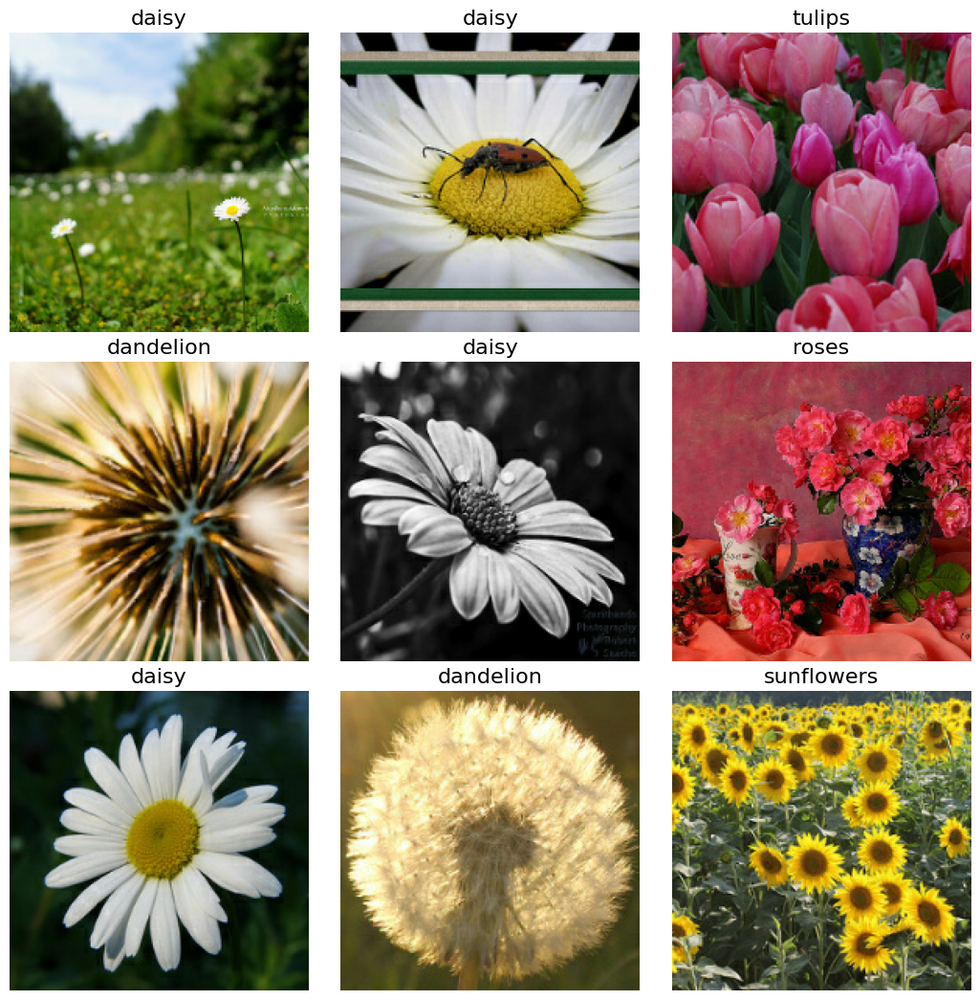

In [ ]:
display_9_images_from_dataset(load_dataset(training_filenames))

## training and validation datasets

In [ ]:
def get_batched_dataset(filenames, train=False):
  dataset = load_dataset(filenames)
  dataset = dataset.cache() # This dataset fits in RAM
  if train:
    # Best practices for Keras:
    # Training dataset: repeat then batch
    # Evaluation dataset: do not repeat
    dataset = dataset.repeat()
  dataset = dataset.batch(BATCH_SIZE)
  dataset = dataset.prefetch(AUTOTUNE) # prefetch next batch while training (autotune prefetch buffer size)
  # should shuffle too but this dataset was well shuffled on disk already
  return dataset
  # source: Dataset performance guide: https://www.tensorflow.org/guide/performance/datasets

# instantiate the datasets
training_dataset = get_batched_dataset(training_filenames, train=True)
validation_dataset = get_batched_dataset(validation_filenames, train=False)

# Prueba del Modelo 1

## Model [WORK WAS REQUIRED HERE]

In [ ]:
pretrained_model = tf.keras.applications.MobileNetV2(input_shape=[*IMAGE_SIZE, 3], include_top=False)
#pretrained_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False ,input_shape=[*IMAGE_SIZE, 3])
#pretrained_model = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=[*IMAGE_SIZE, 3])
#pretrained_model = tf.keras.applications.MobileNet(weights='imagenet', include_top=False, input_shape=[*IMAGE_SIZE, 3])
pretrained_model.trainable = False

### QUESTION 1.
model = tf.keras.Sequential([
    pretrained_model,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(5, activation='softmax')
])

model.compile(
    optimizer='adam',
    loss = 'sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

9406464/9406464 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_192 (Funct  (None, 6, 6, 1280)       2257984   
 ional)                                                          
                                                                 
 flatten (Flatten)           (None, 46080)             0         
                                                                 
 dense (Dense)               (None, 5)                 230405    
                                                                 
Total params: 2,488,389
Trainable params: 230,405
Non-trainable params: 2,257,984
_________________________________________________________________


## Training

In [ ]:
history = model.fit(training_dataset, steps_per_epoch=steps_per_epoch, epochs=EPOCHS,
                    validation_data=validation_dataset, validation_steps=validation_steps)

Epoch 1/10
46/46 [==============================] - 21s 188ms/step - loss: 1.3783 - accuracy: 0.7880 - val_loss: 1.2180 - val_accuracy: 0.8031
Epoch 2/10
46/46 [==============================] - 4s 85ms/step - loss: 0.3501 - accuracy: 0.9344 - val_loss: 1.3651 - val_accuracy: 0.8438
Epoch 3/10
46/46 [==============================] - 4s 86ms/step - loss: 0.2516 - accuracy: 0.9548 - val_loss: 1.6400 - val_accuracy: 0.8281
Epoch 4/10
46/46 [==============================] - 4s 92ms/step - loss: 0.1322 - accuracy: 0.9735 - val_loss: 1.6575 - val_accuracy: 0.8422
Epoch 5/10
46/46 [==============================] - 3s 76ms/step - loss: 0.0687 - accuracy: 0.9847 - val_loss: 1.5259 - val_accuracy: 0.8500
Epoch 6/10
46/46 [==============================] - 4s 77ms/step - loss: 0.0378 - accuracy: 0.9915 - val_loss: 1.6556 - val_accuracy: 0.8375
Epoch 7/10
46/46 [==============================] - 4s 91ms/step - loss: 0.0222 - accuracy: 0.9966 - val_loss: 1.6097 - val_accuracy: 0.8438
Epoch 8/10


dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


<ipython-input-3-aade3991aa28>:57: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(subplot)


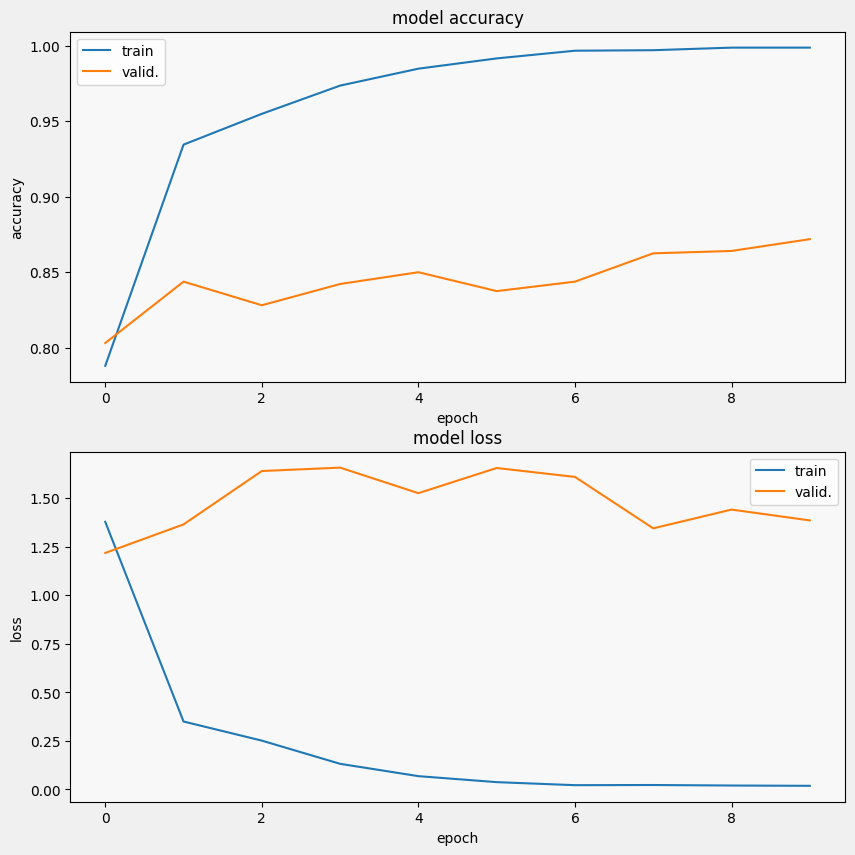

In [ ]:
print(history.history.keys())
display_training_curves(history.history['accuracy'], history.history['val_accuracy'], 'accuracy', 211)
display_training_curves(history.history['loss'], history.history['val_loss'], 'loss', 212)

## Predictions

In [ ]:
# random input: execute multiple times to change results
flowers, labels = dataset_to_numpy_util(load_dataset(validation_filenames).skip(np.random.randint(300)), 9)

predictions = model.predict(flowers, steps=1)
print(np.array(CLASSES)[np.argmax(predictions, axis=-1)].tolist())

1/1 [==============================] - 1s 1s/step
['sunflowers', 'tulips', 'daisy', 'roses', 'dandelion', 'dandelion', 'sunflowers', 'dandelion', 'daisy']


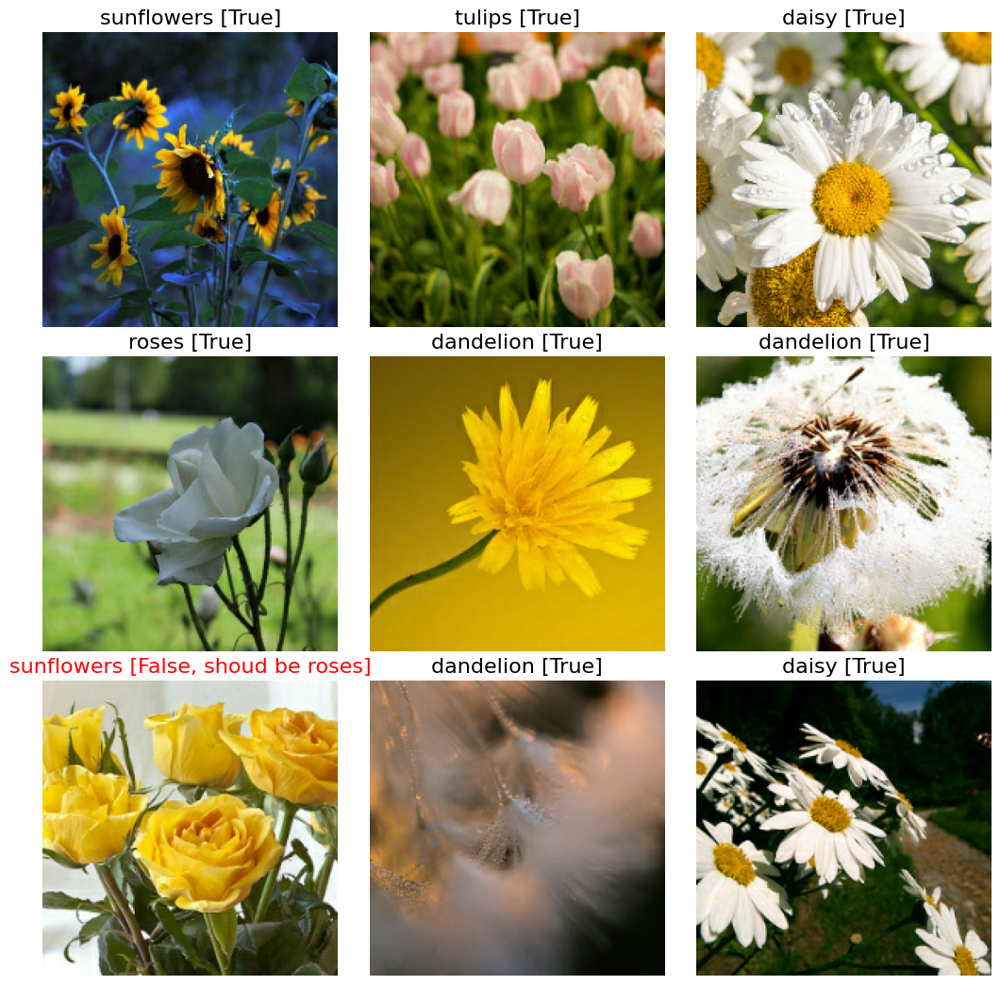

In [ ]:
display_9_images_with_predictions(flowers, predictions, labels)

# Prueba del Modelo 2

## Model [WORK WAS REQUIRED HERE]

In [ ]:
# pretrained_model = tf.keras.applications.MobileNetV2(input_shape=[*IMAGE_SIZE, 3], include_top=False)
pretrained_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False ,input_shape=[*IMAGE_SIZE, 3])
#pretrained_model = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=[*IMAGE_SIZE, 3])
#pretrained_model = tf.keras.applications.MobileNet(weights='imagenet', include_top=False, input_shape=[*IMAGE_SIZE, 3])
pretrained_model.trainable = False

### QUESTION 2.
model = tf.keras.Sequential([
    pretrained_model,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(5, activation='softmax')
])

model.compile(
    optimizer='adam',
    loss = 'sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

58889256/58889256 [==============================] - 2s 0us/step
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 6, 6, 512)         14714688  
                                                                 
 flatten_1 (Flatten)         (None, 18432)             0         
                                                                 
 dense_1 (Dense)             (None, 5)                 92165     
                                                                 
Total params: 14,806,853
Trainable params: 92,165
Non-trainable params: 14,714,688
_________________________________________________________________


## Training

In [ ]:
history = model.fit(training_dataset, steps_per_epoch=steps_per_epoch, epochs=EPOCHS,
                    validation_data=validation_dataset, validation_steps=validation_steps)

Epoch 1/10
46/46 [==============================] - 18s 234ms/step - loss: 0.8817 - accuracy: 0.6814 - val_loss: 0.5993 - val_accuracy: 0.7828
Epoch 2/10
46/46 [==============================] - 10s 228ms/step - loss: 0.3950 - accuracy: 0.8672 - val_loss: 0.6431 - val_accuracy: 0.7547
Epoch 3/10
46/46 [==============================] - 10s 209ms/step - loss: 0.2740 - accuracy: 0.9222 - val_loss: 0.6305 - val_accuracy: 0.7656
Epoch 4/10
46/46 [==============================] - 11s 230ms/step - loss: 0.2081 - accuracy: 0.9423 - val_loss: 0.5515 - val_accuracy: 0.7922
Epoch 5/10
46/46 [==============================] - 10s 229ms/step - loss: 0.1714 - accuracy: 0.9545 - val_loss: 0.5104 - val_accuracy: 0.8094
Epoch 6/10
46/46 [==============================] - 11s 231ms/step - loss: 0.1349 - accuracy: 0.9718 - val_loss: 0.6061 - val_accuracy: 0.8047
Epoch 7/10
46/46 [==============================] - 11s 235ms/step - loss: 0.1150 - accuracy: 0.9732 - val_loss: 1.0815 - val_accuracy: 0.7109

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


<ipython-input-3-aade3991aa28>:57: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(subplot)


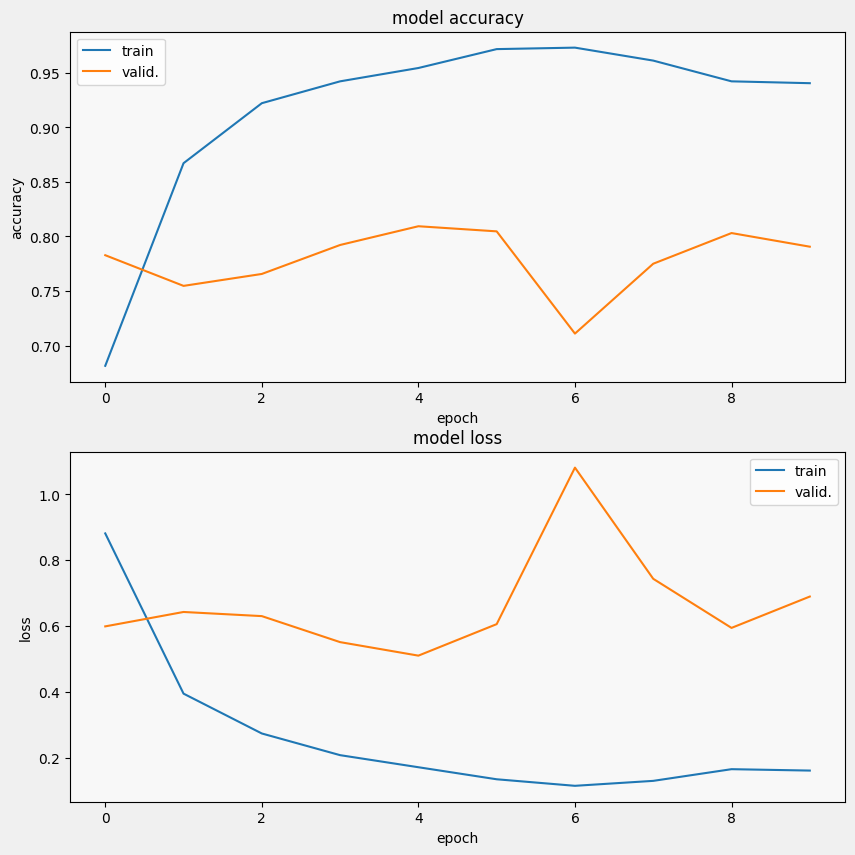

In [ ]:
print(history.history.keys())
display_training_curves(history.history['accuracy'], history.history['val_accuracy'], 'accuracy', 211)
display_training_curves(history.history['loss'], history.history['val_loss'], 'loss', 212)

## Predictions

In [ ]:
# random input: execute multiple times to change results
flowers, labels = dataset_to_numpy_util(load_dataset(validation_filenames).skip(np.random.randint(300)), 9)

predictions = model.predict(flowers, steps=1)
print(np.array(CLASSES)[np.argmax(predictions, axis=-1)].tolist())

1/1 [==============================] - 1s 1s/step
['daisy', 'tulips', 'sunflowers', 'daisy', 'daisy', 'sunflowers', 'daisy', 'roses', 'dandelion']


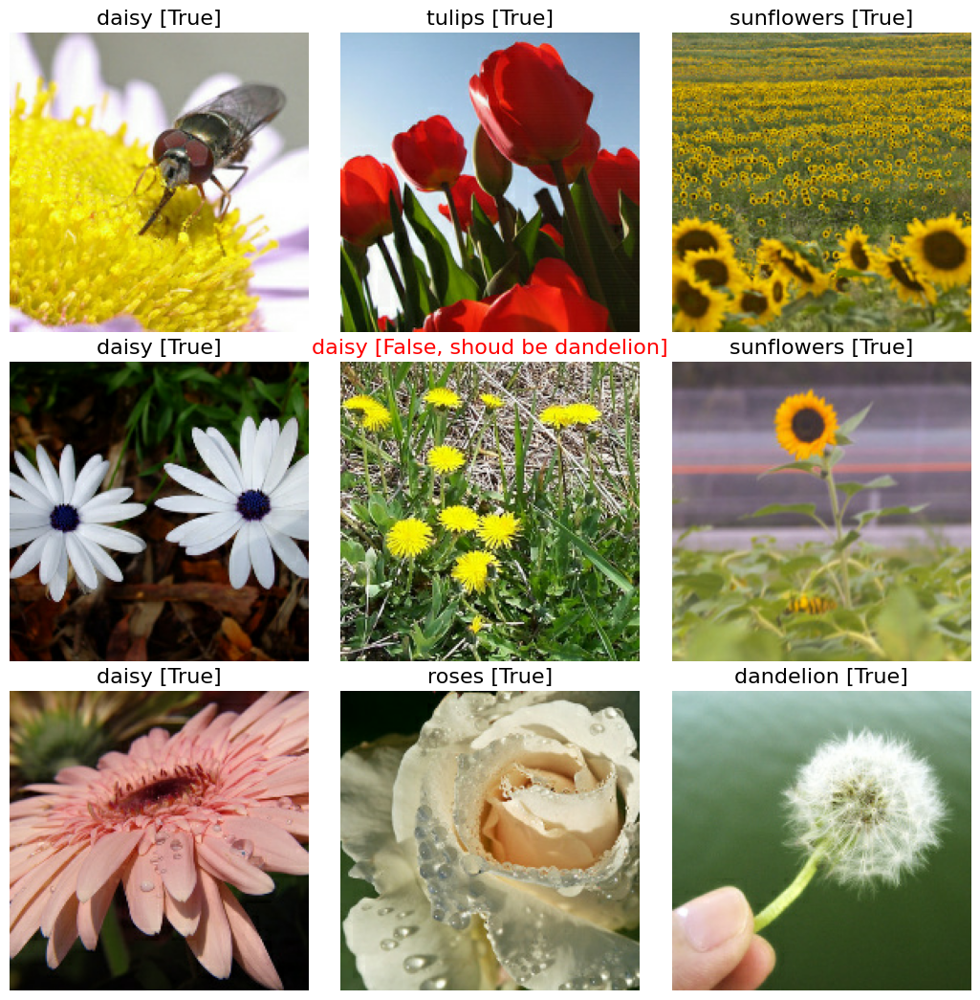

In [ ]:
display_9_images_with_predictions(flowers, predictions, labels)

# Prueba del Modelo 3

## Model [WORK WAS REQUIRED HERE]

In [ ]:
# pretrained_model = tf.keras.applications.MobileNetV2(input_shape=[*IMAGE_SIZE, 3], include_top=False)
#pretrained_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False ,input_shape=[*IMAGE_SIZE, 3])
pretrained_model = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=[*IMAGE_SIZE, 3])
#pretrained_model = tf.keras.applications.MobileNet(weights='imagenet', include_top=False, input_shape=[*IMAGE_SIZE, 3])
pretrained_model.trainable = False

### QUESTION 1.
model = tf.keras.Sequential([
    pretrained_model,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(5, activation='softmax')
])

model.compile(
    optimizer='adam',
    loss = 'sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

94765736/94765736 [==============================] - 3s 0us/step
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 6, 6, 2048)        23587712  
                                                                 
 flatten_2 (Flatten)         (None, 73728)             0         
                                                                 
 dense_2 (Dense)             (None, 5)                 368645    
                                                                 
Total params: 23,956,357
Trainable params: 368,645
Non-trainable params: 23,587,712
_________________________________________________________________


## Training

In [ ]:
history = model.fit(training_dataset, steps_per_epoch=steps_per_epoch, epochs=EPOCHS,
                    validation_data=validation_dataset, validation_steps=validation_steps)

Epoch 1/10
46/46 [==============================] - 15s 182ms/step - loss: 2.1046 - accuracy: 0.3098 - val_loss: 1.5056 - val_accuracy: 0.4094
Epoch 2/10
46/46 [==============================] - 7s 161ms/step - loss: 1.3573 - accuracy: 0.4361 - val_loss: 1.4200 - val_accuracy: 0.4187
Epoch 3/10
46/46 [==============================] - 7s 160ms/step - loss: 1.3048 - accuracy: 0.4708 - val_loss: 1.3468 - val_accuracy: 0.4625
Epoch 4/10
46/46 [==============================] - 9s 191ms/step - loss: 1.2022 - accuracy: 0.5166 - val_loss: 1.2559 - val_accuracy: 0.4906
Epoch 5/10
46/46 [==============================] - 9s 191ms/step - loss: 1.1541 - accuracy: 0.5448 - val_loss: 1.3052 - val_accuracy: 0.4859
Epoch 6/10
46/46 [==============================] - 9s 190ms/step - loss: 1.0915 - accuracy: 0.5802 - val_loss: 1.2383 - val_accuracy: 0.5469
Epoch 7/10
46/46 [==============================] - 7s 162ms/step - loss: 1.0423 - accuracy: 0.5992 - val_loss: 1.2979 - val_accuracy: 0.5156
Epoch

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


<ipython-input-3-aade3991aa28>:57: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(subplot)


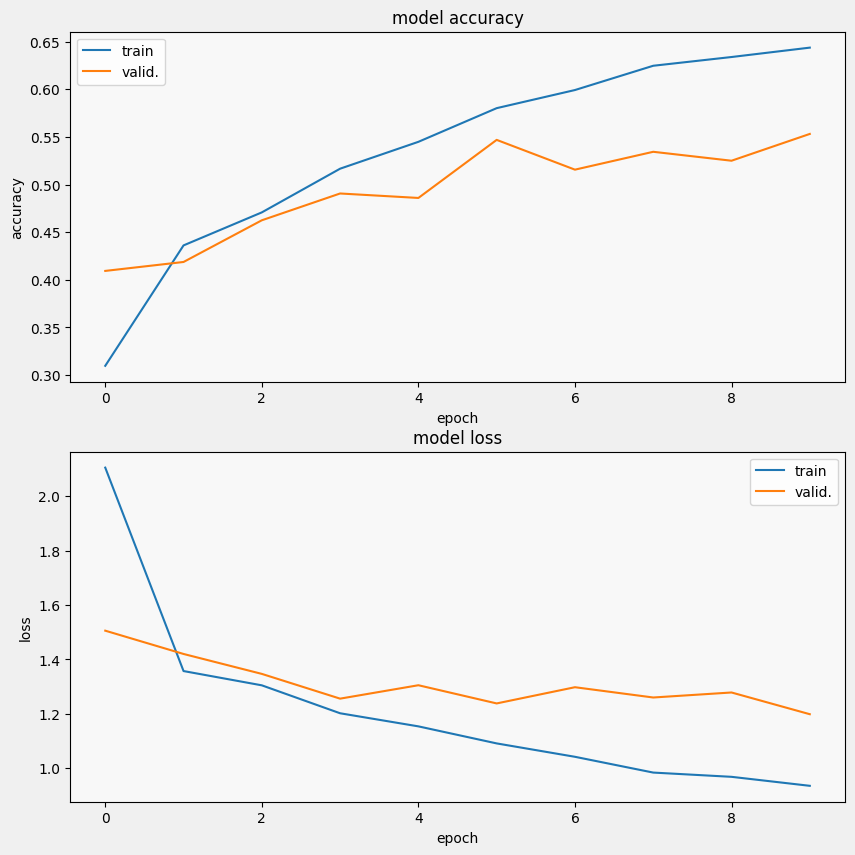

In [ ]:
print(history.history.keys())
display_training_curves(history.history['accuracy'], history.history['val_accuracy'], 'accuracy', 211)
display_training_curves(history.history['loss'], history.history['val_loss'], 'loss', 212)

## Predictions

In [ ]:
# random input: execute multiple times to change results
flowers, labels = dataset_to_numpy_util(load_dataset(validation_filenames).skip(np.random.randint(300)), 9)

predictions = model.predict(flowers, steps=1)
print(np.array(CLASSES)[np.argmax(predictions, axis=-1)].tolist())

1/1 [==============================] - 1s 1s/step
['roses', 'dandelion', 'daisy', 'daisy', 'sunflowers', 'dandelion', 'dandelion', 'roses', 'dandelion']


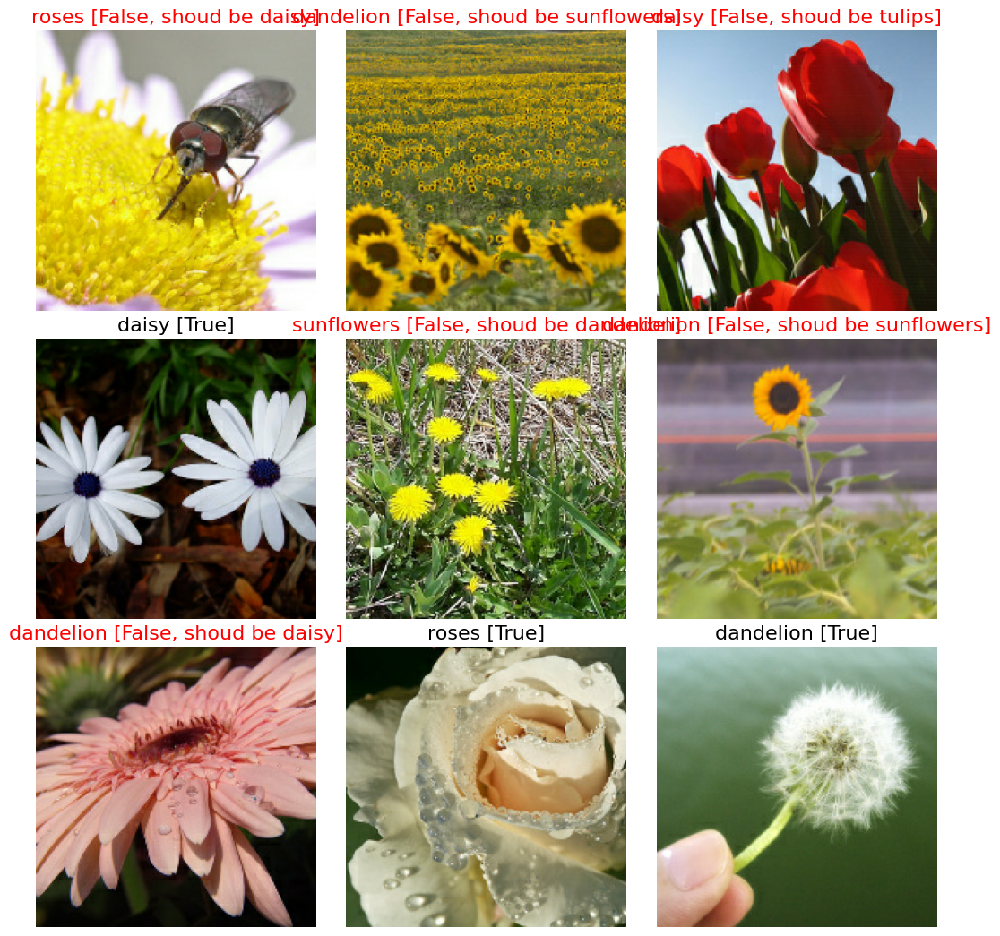

In [ ]:
display_9_images_with_predictions(flowers, predictions, labels)

# Prueba del Modelo 4

## Model [WORK WAS REQUIRED HERE]

In [ ]:
# pretrained_model = tf.keras.applications.MobileNetV2(input_shape=[*IMAGE_SIZE, 3], include_top=False)
#pretrained_model = tf.keras.applications.VGG16(weights='imagenet', include_top=False ,input_shape=[*IMAGE_SIZE, 3])
#pretrained_model = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=[*IMAGE_SIZE, 3])
pretrained_model = tf.keras.applications.MobileNet(weights='imagenet', include_top=False, input_shape=[*IMAGE_SIZE, 3])
pretrained_model.trainable = False

### QUESTION 1.
model = tf.keras.Sequential([
    pretrained_model,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(5, activation='softmax')
])

model.compile(
    optimizer='adam',
    loss = 'sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

17225924/17225924 [==============================] - 1s 0us/step
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_192 (Functio  (None, 6, 6, 1024)       3228864   
 nal)                                                            
                                                                 
 flatten_3 (Flatten)         (None, 36864)             0         
                                                                 
 dense_3 (Dense)             (None, 5)                 184325    
                                                                 
Total params: 3,413,189
Trainable params: 184,325
Non-trainable params: 3,228,864
_________________________________________________________________


## Training

In [ ]:
history = model.fit(training_dataset, steps_per_epoch=steps_per_epoch, epochs=EPOCHS,
                    validation_data=validation_dataset, validation_steps=validation_steps)

Epoch 1/10
46/46 [==============================] - 6s 78ms/step - loss: 2.0040 - accuracy: 0.7697 - val_loss: 1.1106 - val_accuracy: 0.8422
Epoch 2/10
46/46 [==============================] - 3s 72ms/step - loss: 0.2546 - accuracy: 0.9446 - val_loss: 1.3130 - val_accuracy: 0.8406
Epoch 3/10
46/46 [==============================] - 3s 68ms/step - loss: 0.1420 - accuracy: 0.9667 - val_loss: 1.5483 - val_accuracy: 0.8438
Epoch 4/10
46/46 [==============================] - 3s 71ms/step - loss: 0.0598 - accuracy: 0.9854 - val_loss: 1.4020 - val_accuracy: 0.8469
Epoch 5/10
46/46 [==============================] - 3s 70ms/step - loss: 0.0203 - accuracy: 0.9969 - val_loss: 0.9956 - val_accuracy: 0.8750
Epoch 6/10
46/46 [==============================] - 3s 71ms/step - loss: 0.0109 - accuracy: 0.9993 - val_loss: 0.9245 - val_accuracy: 0.8766
Epoch 7/10
46/46 [==============================] - 3s 70ms/step - loss: 0.0132 - accuracy: 0.9993 - val_loss: 0.9373 - val_accuracy: 0.8766
Epoch 8/10
46

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


<ipython-input-3-aade3991aa28>:57: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(subplot)


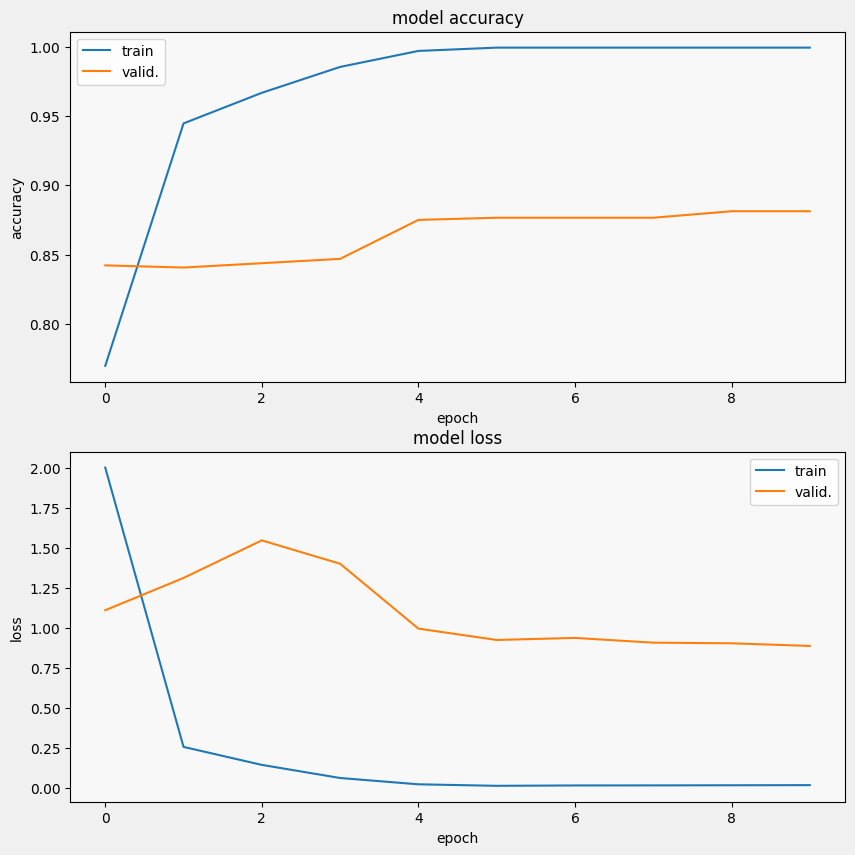

In [ ]:
print(history.history.keys())
display_training_curves(history.history['accuracy'], history.history['val_accuracy'], 'accuracy', 211)
display_training_curves(history.history['loss'], history.history['val_loss'], 'loss', 212)

## Predictions

In [ ]:
# random input: execute multiple times to change results
flowers, labels = dataset_to_numpy_util(load_dataset(validation_filenames).skip(np.random.randint(300)), 9)

predictions = model.predict(flowers, steps=1)
print(np.array(CLASSES)[np.argmax(predictions, axis=-1)].tolist())

1/1 [==============================] - 1s 902ms/step
['tulips', 'dandelion', 'dandelion', 'sunflowers', 'sunflowers', 'roses', 'daisy', 'roses', 'sunflowers']


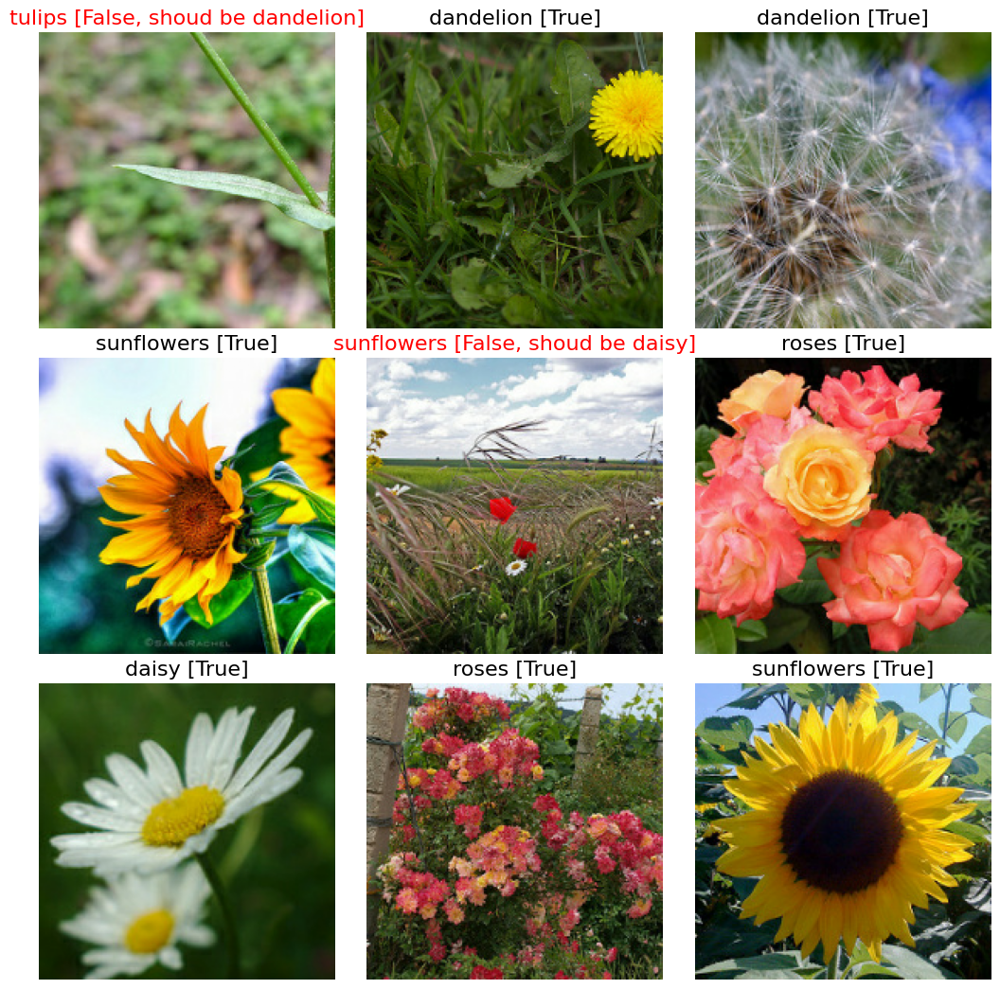

In [ ]:
display_9_images_with_predictions(flowers, predictions, labels)

# Conclusiones

---



## **COMPARATIVA DE LOS 4 MODELOS**

MobileNetV2
Este modelo es realmente impresionante, lo que lo hace extremadamente eficiente. Durante nuestro proceso de entrenamiento, cada vuelta tomó solamente 4 segundos, lo cual es asombroso. Después de realizar 10 rondas, obtuvimos una precisión del 99.86% en los datos de entrenamiento, lo cual es un resultado excelente. Sin embargo, debemos tener cuidado, ya que es posible que esté demasiado ajustado a nuestros datos de entrenamiento. En los datos de validación, observamos una disminución en la precisión al 87.19% y un aumento considerable en la pérdida. Al realizar predicciones con datos reales, el modelo falló solo una vez de nueve intentos, lo cual también es aceptable.

VGG16
Este modelo es como el abuelo confiable de las redes convolucionales. Aunque es más simple en comparación con MobileNetV2, cumple su función de manera efectiva. Claro está, es más lento, ya que cada vuelta tomó alrededor de 11 segundos. Después de completar 10 rondas de entrenamiento, alcanzamos una precisión del 94.06%, lo cual es aceptable aunque no tan alto como el MobileNetV2. En los datos de validación, la precisión se redujo al 79.06%, lo que indica que el modelo no está sobreajustado. En cuanto a las predicciones, también falló una vez de nueve, al igual que el MobileNetV2.

ResNet50
Podríamos considerar a ResNet50 como el "tanque" de las redes neuronales debido a sus 50 capas y el uso de conexiones residuales para evitar problemas en redes muy profundas. Aunque es más lento que MobileNetV2, requiriendo aproximadamente 9 segundos por vuelta, no funcionó de manera óptima en nuestro caso. Solo logró una precisión del 64.37% en los datos de entrenamiento y un 55.31% en los datos de validación. Además, falló en 6 de las 9 predicciones. En conclusión, ResNet50 no se destacó como nuestro modelo estrella en este proyecto.

MobileNet
Este modelo es como el hermano menor de MobileNetV2. Al igual que su contraparte, está diseñado para dispositivos móviles y es extremadamente rápido, con cada vuelta tomando solamente 3 segundos. Después de 10 rondas, obtuvimos una precisión del 99.93% en los datos de entrenamiento, incluso mejor que MobileNetV2. Sin embargo, al igual que su hermano mayor, parece haberse sobreajustado a los datos de entrenamiento, ya que la precisión en los datos de validación fue del 88.13%. Además, falló en dos de las nueve predicciones, lo cual es un rendimiento ligeramente inferior en comparación con MobileNetV2 y VGG16 en este aspecto.